In [1]:
import numpy as np

#self written libraries
from model_builder import ModelBuild

from data_prep import DataPrep
from lime_evaluator import Lime_eval
from fooling_LIME_files.utils import *
from fooling_LIME_files.adversarial_models import *

#other libraries
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lime.lime_tabular
from somlime.lime_tabular import LimeTabularExplainerSOM

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
# pandas concat in lime_evaluator

In [2]:
params = Params("fooling_LIME_files/model_configurations/experiment_params.json")
data_location = "./data/compas-scores-two-years.csv"
compas_score_full = pd.read_csv(data_location)
data_prepper = DataPrep(compas_score_full)
X, y, X_cols = data_prepper.get()

# Add a random column -- this is what we'll have LIME/SHAP explain.
X['unrelated_column'] = np.random.choice([0,1],size=X.shape[0])
features = [c for c in X]

categorical_feature_name = ['two_year_recid', 'c_charge_degree_F', 'c_charge_degree_M',\
                            'sex_Female', 'sex_Male', 'race']

categorical_feature_indcs = [features.index(c) for c in categorical_feature_name]
race_indc = features.index('race')
unrelated_indcs = features.index('unrelated_column')

X=X.to_numpy()
#make all columns float
X = X.astype(float)
y=np.array(y)

Next, let's set up our model f and psi.  f is the what we _actually_ want to classify the data by and psi
is what we want LIME/SHAP to explain.

In [3]:
class racist_model_f:
    # Decision rule: classify negatively if race is black
    def predict(self,X):
        return np.array([params.negative_outcome if x[race_indc] > 0 else params.positive_outcome for x in X])

    def predict_proba(self, X): 
        return one_hot_encode(self.predict(X))

    def score(self, X,y):
        return np.sum(self.predict(X)==y) / len(X)
    
class innocuous_model_psi:
    # Decision rule: classify according to randomly drawn column 'unrelated column'
    def predict(self,X):
        return np.array([params.negative_outcome if x[unrelated_indcs] > 0 else params.positive_outcome for x in X])

    def predict_proba(self, X): 
        return one_hot_encode(self.predict(X))

    def score(self, X,y):
        return np.sum(self.predict(X)==y) / len(X)

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=32, shuffle=True)

# Split the data and normalize
xtrainmodel,xtestmodel,ytrainmodel,ytestmodel = train_test_split(X,y)
xtest_not_normalized = deepcopy(xtestmodel)
ss = StandardScaler().fit(xtrainmodel)
xtrainmodel = ss.transform(xtrainmodel)
xtestmodel = ss.transform(xtestmodel)

# Train the adversarial model for LIME with f and psi 
adv_lime = Adversarial_Lime_Model(racist_model_f(), innocuous_model_psi()).\
            train(xtrainmodel, ytrainmodel, feature_names=features, categorical_features=categorical_feature_indcs)

In [5]:
#instance to explain (for easy column viewing converted to pandas)
print(f"Instance to be explained:\n{pd.DataFrame(X_test, columns=features).iloc[0]}")
print(f"Instance to be explained as list: {X_test[0]}")

Instance to be explained:
age                  34.0
two_year_recid        1.0
priors_count          0.0
length_of_stay        2.0
c_charge_degree_F     1.0
c_charge_degree_M     0.0
sex_Female            0.0
sex_Male              1.0
race                  0.0
unrelated_column      1.0
Name: 0, dtype: float64
Instance to be explained as list: [34.  1.  0.  2.  1.  0.  0.  1.  0.  1.]


# original LIME

In [6]:
# Let's just look at a the first example in the test set
ex_indc = 0

# To get a baseline, we'll look at LIME applied to the biased model f
normal_explainer = lime.lime_tabular.LimeTabularExplainer(X_train,feature_names=adv_lime.get_column_names(),
                                                          discretize_continuous=False,
                                                          categorical_features=categorical_feature_indcs, sample_around_instance=True)

exp_inst = normal_explainer.explain_instance(X_test[ex_indc], racist_model_f().predict_proba)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 
adv_explainer = lime.lime_tabular.LimeTabularExplainer(X_train,feature_names=adv_lime.get_column_names(), 
                                                       discretize_continuous=False,
                                                       categorical_features=categorical_feature_indcs, sample_around_instance=True)

exp_inst = adv_explainer.explain_instance(X_test[ex_indc], adv_lime.predict_proba)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


Explanation on biased f:
 [('race=0', 0.9986503008502016), ('sex_Male=1', 4.6023606258077685e-05), ('c_charge_degree_M=0', 3.864585397816278e-05)] 


Explanation on adversarial model:
 [('unrelated_column', -0.043620572147316766), ('sex_Female=0', -0.011505672838476338), ('race=0', -0.003785822249177137)] 

Prediction fidelity: 0.0


# Train SOM and explain with SOMLIME

In [7]:
from somlime import som
som_shape  = (5, 5)
som_model = som.SOM(som_shape , X_train.shape[1], sigma=0.5, learning_rate=0.5)
som_model.train(X_train, 1000)

explainer_lime = LimeTabularExplainerSOM(training_data=X_train,
                                            feature_names=features,
                                            class_names=['bad', 'good'],
                                            mode='classification', 
                                            discretize_continuous=False,
                                            categorical_features=categorical_feature_indcs, sample_around_instance=True)

# Experiment 1 
Distance between centroids 

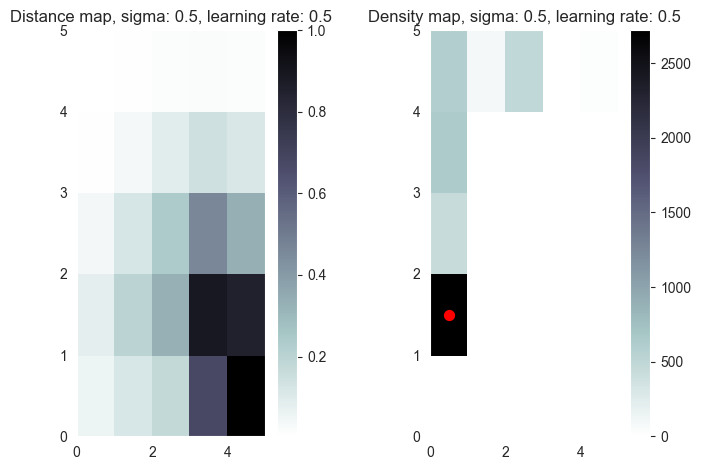

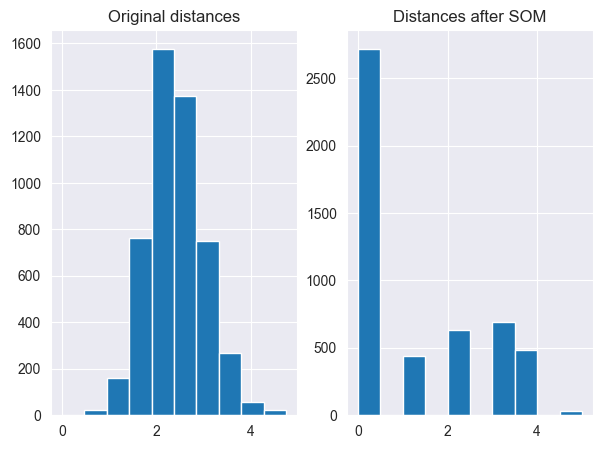

Explanation on biased f:
 [('race=0', 0.9989875941988143), ('sex_Male=1', -4.154302446301314e-05), ('sex_Female=0', -3.9921493468783325e-05)] 


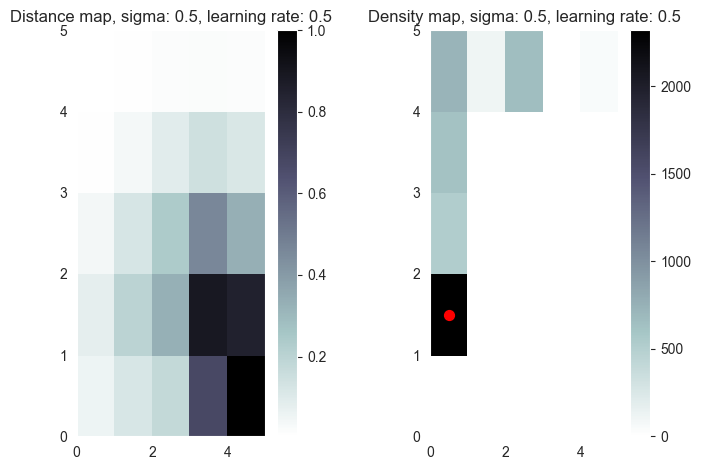

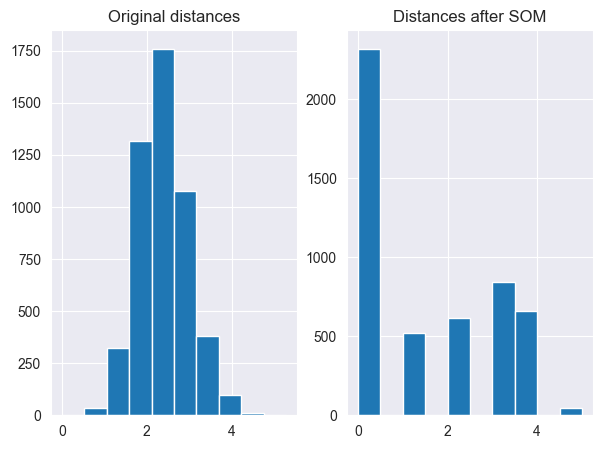

Explanation on adversarial model:
 [('unrelated_column', -0.04481632862601506), ('sex_Male=1', -0.01029809312717025), ('two_year_recid=1', 0.004303645441386129)] 

Prediction fidelity: 0.0


In [8]:
exp_inst = explainer_lime.explain_instance(X_test[ex_indc], racist_model_f().predict_proba, som_model, num_features=7, plot=True, experiment=1)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], adv_lime.predict_proba, som_model, num_features=7, plot=True, experiment=1)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


# Experiment 2
Distance between centroids + euclidean distance 


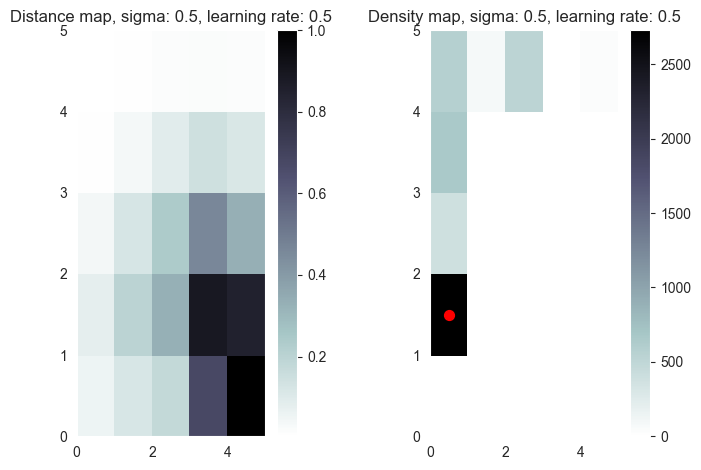

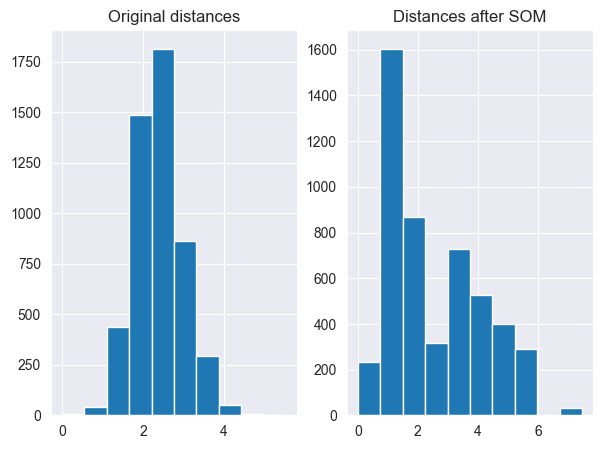

Explanation on biased f:
 [('race=0', 0.9985861056144556), ('sex_Female=0', -0.00010595618080104029), ('c_charge_degree_F=1', 8.267202503662651e-05)] 


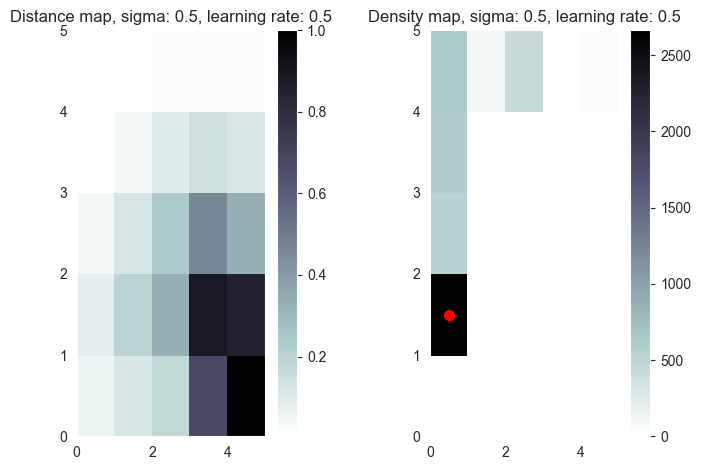

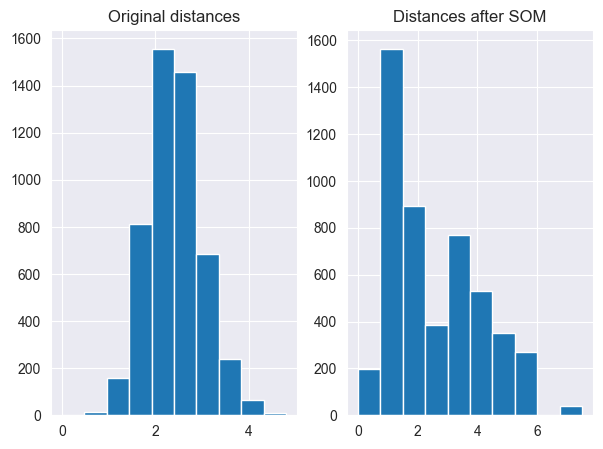

Explanation on adversarial model:
 [('unrelated_column', -0.03928876453753237), ('c_charge_degree_F=1', -0.006393139006200948), ('sex_Female=0', -0.006255916184439239)] 

Prediction fidelity: 0.0


In [9]:
exp_inst = explainer_lime.explain_instance(X_test[ex_indc], racist_model_f().predict_proba, som_model, num_features=7, plot=True, experiment=2)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], adv_lime.predict_proba, som_model, num_features=7, plot=True, experiment=2)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


# Experiment 3

Euclidean distance for instances in the same cluster of instances to explain, 10 is for istances that are out of cluster 



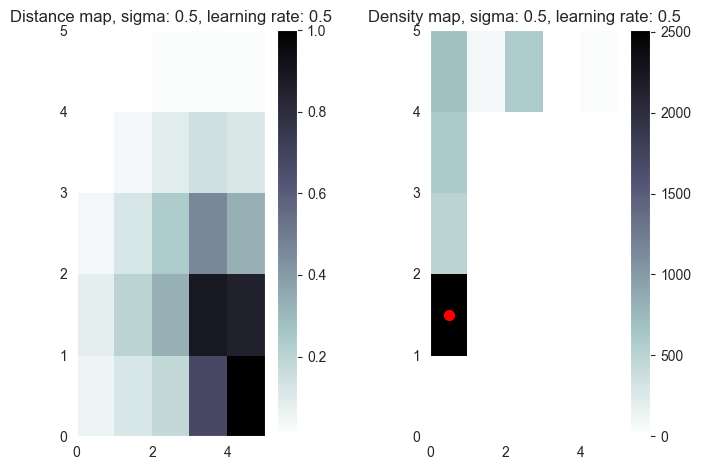

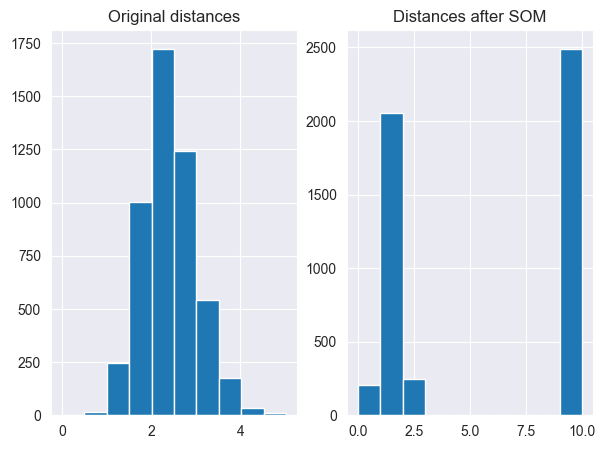

Explanation on biased f:
 [('race=0', 0.9976460089073377), ('c_charge_degree_F=1', 0.0006296056325365591), ('two_year_recid=1', 0.0003997139444747358)] 


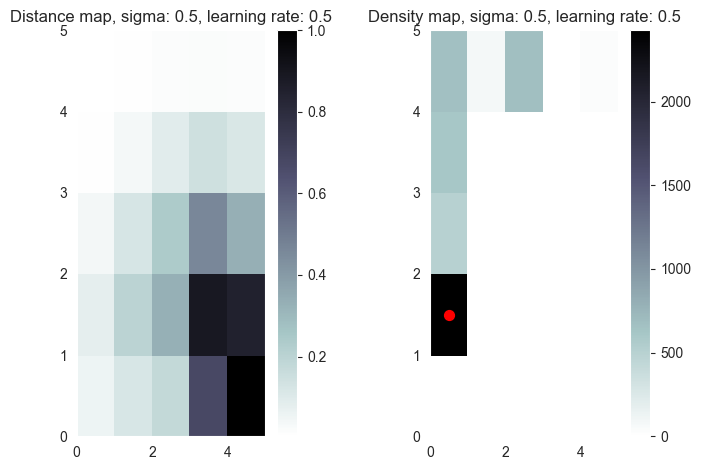

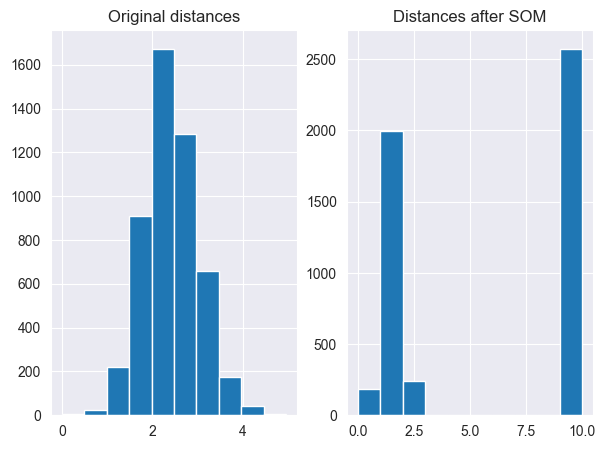

Explanation on adversarial model:
 [('unrelated_column', -0.02617676125667461), ('sex_Female=0', -0.006003238936214529), ('c_charge_degree_M=0', -0.004200607368107234)] 

Prediction fidelity: 0.0


In [10]:
exp_inst = explainer_lime.explain_instance(X_test[ex_indc], racist_model_f().predict_proba, som_model, num_features=7, plot=True, experiment=3)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], adv_lime.predict_proba, som_model, num_features=7, plot=True, experiment=3)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


# DecisionTree LIME

Explanation on biased f:
 [('race=0', 1.0), ('c_charge_degree_F=1', 0.0), ('sex_Male=1', 0.0)] 


Explanation on adversarial model:
 [('unrelated_column', 1.0), ('c_charge_degree_F=1', 0.0), ('sex_Male=1', 0.0)] 

Prediction fidelity: 0.0


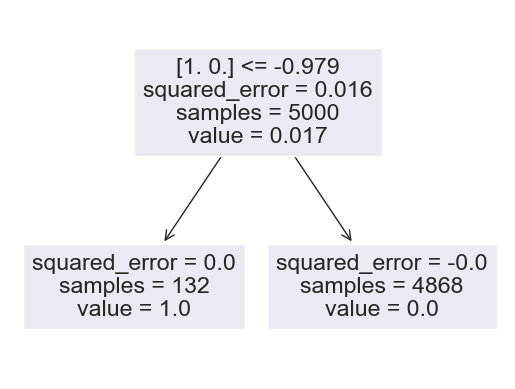

In [11]:
from decision_tree_lime.lime_tabular import LimeTabularExplainerDT as LTE_dt
explainer_lime = LTE_dt(X_train,feature_names=features,
                                      discretize_continuous=False,
                                      categorical_features=categorical_feature_indcs, sample_around_instance=True)

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], racist_model_f().predict_proba)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], adv_lime.predict_proba)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


# Naive Bayes LIME

In [12]:
from NB_lime.lime_tabular import LimeTabularExplainer_NB
explainer_lime = LimeTabularExplainer_NB(X_train,feature_names=features,
                                      discretize_continuous=False,
                                      categorical_features=categorical_feature_indcs, sample_around_instance=True)

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], racist_model_f().predict_proba)
normal_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on biased f:\n",normal_exp[:3],"\n\n")

# Now, lets look at the explanations on the adversarial model 

exp_inst = explainer_lime.explain_instance(X_test[ex_indc], adv_lime.predict_proba)
adv_exp = exp_inst.as_list()
exp_inst.show_in_notebook()
print ("Explanation on adversarial model:\n",adv_exp[:3],"\n")

print("Prediction fidelity: {0:3.2}".format(adv_lime.fidelity(X_test[ex_indc:ex_indc+1])))


Explanation on biased f:
 [('race=0', 1.0), ('length_of_stay', 0.018441344139890535), ('two_year_recid=1', 0.015280217662202078)] 


Explanation on adversarial model:
 [('unrelated_column', 1.0), ('length_of_stay', 0.005710816686176978), ('c_charge_degree_F=1', 0.004108292314366154)] 

Prediction fidelity: 0.0
